In [1]:
#read in file
import pandas as pd

pd.set_option('display.max_columns', 150)

# Where to retrieve voter data files
Usually you can just search "[state] voter file" and you'll find it.
This project was made using Ohio voter files, so I went to https://www6.ohiosos.gov/ords/f?p=VOTERFTP:HOME:::#cntyVtrFiles and downloaded a county voter file.  I chose Hamilton county.  

Make sure to change your filename to the path where your voter file is saved in the next line.  

In [2]:
voter_file_df = pd.read_csv("HAMILTON.txt", sep=',')

C:\Users\kevin\AppData\Local\Programs\Python\Python38\lib\site-packages\IPython\core\interactiveshell.py:3071: DtypeWarning: Columns (58,64,66,67,73,74,78,79,82,87,93,96,97,100,103,106) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [3]:
import geopandas as gpd

from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter

import time

In [4]:
#the voter file I worked with is about 500k records long.  At 1 second per geocode, that takes about a week.
#So I sampled down the dataset into a more manageable file.

test_df = voter_file_df.sample(25000)

In [5]:
full_addr = []
addr_str = ''
for index, row in test_df.iterrows():
    addr_str = row['RESIDENTIAL_ADDRESS1'] + ". " + row['RESIDENTIAL_CITY'] + ", " + row['RESIDENTIAL_STATE'] + " " + str(row['RESIDENTIAL_ZIP']) + " USA"   
    full_addr.append(addr_str)
    addr_str = ''

test_df['FULL_ADDRESS'] = full_addr
test_df['FULL_ADDRESS'].head()

218346    8534 WYOMING CLUB DR. CINCINNATI, OH 45215 USA
203100          3465 MIRROR LN. CINCINNATI, OH 45248 USA
92917          4357 HAIGHT AVE. CINCINNATI, OH 45223 USA
297014        3171 PRESERVE LN. CINCINNATI, OH 45239 USA
118727     8769 BROOKSCREEK DR. CINCINNATI, OH 45249 USA
Name: FULL_ADDRESS, dtype: object

In [6]:
t1 = time.time()

locator = Nominatim(user_agent='kevin.hengehold@gmail.com')
geocode = RateLimiter(locator.geocode, min_delay_seconds=1)
test_df['LOCATION'] = test_df['FULL_ADDRESS'].apply(geocode)

t_diff = time.time() - t1

print("Elapsed time: ", t_diff, "s")

Elapsed time:  25019.028314590454 s


In [7]:
test_df.head()

,SOS_VOTERID,COUNTY_NUMBER,COUNTY_ID,LAST_NAME,FIRST_NAME,MIDDLE_NAME,SUFFIX,DATE_OF_BIRTH,REGISTRATION_DATE,VOTER_STATUS,PARTY_AFFILIATION,RESIDENTIAL_ADDRESS1,RESIDENTIAL_SECONDARY_ADDR,RESIDENTIAL_CITY,RESIDENTIAL_STATE,RESIDENTIAL_ZIP,RESIDENTIAL_ZIP_PLUS4,RESIDENTIAL_COUNTRY,RESIDENTIAL_POSTALCODE,MAILING_ADDRESS1,MAILING_SECONDARY_ADDRESS,MAILING_CITY,MAILING_STATE,MAILING_ZIP,MAILING_ZIP_PLUS4,MAILING_COUNTRY,MAILING_POSTAL_CODE,CAREER_CENTER,CITY,CITY_SCHOOL_DISTRICT,COUNTY_COURT_DISTRICT,CONGRESSIONAL_DISTRICT,COURT_OF_APPEALS,EDU_SERVICE_CENTER_DISTRICT,EXEMPTED_VILL_SCHOOL_DISTRICT,LIBRARY,LOCAL_SCHOOL_DISTRICT,MUNICIPAL_COURT_DISTRICT,PRECINCT_NAME,PRECINCT_CODE,STATE_BOARD_OF_EDUCATION,STATE_REPRESENTATIVE_DISTRICT,STATE_SENATE_DISTRICT,TOWNSHIP,VILLAGE,WARD,PRIMARY-03/07/2000,GENERAL-11/07/2000,SPECIAL-05/08/2001,GENERAL-11/06/2001,PRIMARY-05/07/2002,GENERAL-11/05/2002,SPECIAL-05/06/2003,GENERAL-11/04/2003,PRIMARY-03/02/2004,GENERAL-11/02/2004,SPECIAL-02/08/2005,PRIMARY-05/03/2005,PRIMARY-09/13/2005,GENERAL-11/08/2005,SPECIAL-02/07/2006,PRIMARY-05/02/2006,GENERAL-11/07/2006,PRIMARY-05/08/2007,PRIMARY-09/11/2007,GENERAL-11/06/2007,PRIMARY-11/06/2007,GENERAL-12/11/2007,PRIMARY-03/04/2008,PRIMARY-10/14/2008,GENERAL-11/04/2008,GENERAL-11/18/2008,PRIMARY-05/05/2009,PRIMARY-09/08/2009,PRIMARY-09/15/2009,PRIMARY-09/29/2009,GENERAL-11/03/2009,PRIMARY-05/04/2010,PRIMARY-07/13/2010,PRIMARY-09/07/2010,GENERAL-11/02/2010,PRIMARY-05/03/2011,PRIMARY-09/13/2011,GENERAL-11/08/2011,PRIMARY-03/06/2012,GENERAL-11/06/2012,PRIMARY-05/07/2013,PRIMARY-09/10/2013,PRIMARY-10/01/2013,GENERAL-11/05/2013,PRIMARY-05/06/2014,GENERAL-11/04/2014,PRIMARY-05/05/2015,PRIMARY-09/15/2015,GENERAL-11/03/2015,PRIMARY-03/15/2016,GENERAL-06/07/2016,PRIMARY-09/13/2016,GENERAL-11/08/2016,PRIMARY-05/02/2017,PRIMARY-09/12/2017,GENERAL-11/07/2017,PRIMARY-05/08/2018,GENERAL-08/07/2018,GENERAL-11/06/2018,PRIMARY-05/07/2019,PRIMARY-09/10/2019,GENERAL-11/05/2019,PRIMARY-03/17/2020,FULL_ADDRESS,LOCATION
218346,OH0024606781,31,1972687,KLEIN,YEVGENIYA,NaN,NaN,1971-06-27,2018-04-20,ACTIVE,NaN,8534 WYOMING CLUB DR,NaN,CINCINNATI,OH,45215,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CINCINNATI PUBLIC SCHOOLS CITY SD,NaN,2,1,NaN,NaN,NaN,NaN,HAMILTON-CO,SPRINGFIELD E,31-BKU,4,33,9,SPRINGFIELD TWP.,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,X,NaN,NaN,NaN,NaN,"8534 WYOMING CLUB DR. CINCINNATI, OH 45215 USA","(8534, Wyoming Club Drive, Valleydale, Springf..."
203100,OH0013967797,31,1090691,DUKE,MARY,BETH,NaN,1955-12-01,1992-09-18,ACTIVE,R,3465 MIRROR LN,NaN,CINCINNATI,OH,45248,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GREAT OAKS CAREER CAMPUSES,NaN,NaN,NaN,1,1,HAMILTON COUNTY ESC,NaN,NaN,OAK HILLS LOCAL SD (HAMILTON),HAMILTON-CO,GREEN QQ,31-BIF,4,30,8,GREEN TWP.,NaN,NaN,X,X,NaN,NaN,NaN,X,NaN,NaN,NaN,X,NaN,NaN,NaN,NaN,NaN,NaN,X,NaN,NaN,NaN,NaN,NaN,NaN,NaN,X,NaN,NaN,NaN,NaN,NaN,X,NaN,NaN,NaN,X,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,X,NaN,NaN,NaN,NaN,NaN,X,NaN,NaN,NaN,R,"3465 MIRROR LN. CINCINNATI, OH 45248 USA","(3465, Mirror Lane, Mack, Green Township, Hami..."
92917,OH0013635383,31,767438,FINKE,LORRAINE,A,NaN,1961-12-08,1989-07-17,ACTIVE,D,4357 HAIGHT AVE,NaN,CINCINNATI,OH,45223,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CINCINNATI CITY,CINCINNATI PUBLIC SCHOOLS CITY SD,NaN,1,1,NaN,NaN,NaN,NaN,HAMILTON-CO,CINCINNATI 23-D,31-AMM,4,32,9,NaN,NaN,CINTI WARD 23,NaN,X,NaN,X,NaN,NaN,NaN,NaN,NaN,X,NaN,NaN,NaN,NaN,NaN,NaN,X,NaN,NaN,X,NaN,NaN,D,NaN,X,NaN,NaN,NaN,NaN,NaN,X,NaN,NaN,NaN,X,NaN,NaN,X,D,X,NaN,NaN,NaN,NaN,NaN,X,NaN,NaN,NaN,D,NaN,NaN,X,NaN,NaN,X,NaN,NaN,X,NaN,NaN,X,D,"4357 HAIGHT AVE. CINCINNATI, OH 45223 USA","(4357, Haight Avenue, Knowltons Corner, Norths..."
297014,OH0014016916,31,1097676,FOSTER,ANTHONY,SHAWN,NaN,1973-09-15,1992-09-26,A

In [8]:
test_df['LAT'] = test_df['LOCATION'].apply(lambda loc: loc.point[0] if loc else None)
test_df['LON'] = test_df['LOCATION'].apply(lambda loc: loc.point[1] if loc else None)


In [11]:
test_gdf = gpd.GeoDataFrame(test_df, geometry=gpd.points_from_xy(test_df.LON, test_df.LAT))
test_gdf.crs = 'NAD83'


# Choose apporpriate shape file from the census website
https://www.census.gov/geographies/mapping-files/time-series/geo/tiger-line-file.html 

In [12]:
oh_census_tracts = gpd.read_file(r'C:\Users\kevin\Documents\jupyter notebooks\voter files\Ohio\OH census tracts\tl_2019_39_tract.shp')

In [13]:
test_gdf['LAT'].count()/len(test_gdf['LAT'])

0.73748

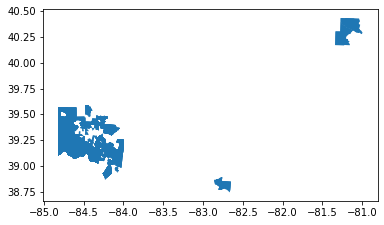

In [14]:
clean_test_gdf = test_gdf.dropna(subset=['LAT'])

census_tract_count = gpd.sjoin(oh_census_tracts, clean_test_gdf, how='inner', op='intersects')
census_tract_count.plot()


In [15]:
#use this step to remove spurious census tracts.  May need to adjust numbers
census_tract_clean_gdf = census_tract_count.drop(census_tract_count[census_tract_count.LON>-83.5].index)

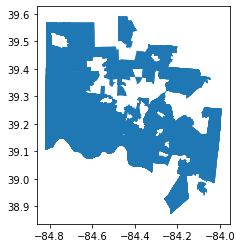

In [17]:
census_tract_clean_gdf.plot()

In [18]:
unique_tracts = census_tract_clean_gdf["NAMELSAD"].unique()

census_tract_counts = census_tract_clean_gdf["NAMELSAD"].value_counts()

In [19]:
plot_gdf = census_tract_clean_gdf.drop_duplicates(subset = ['NAMELSAD'], keep = 'first')

In [21]:
voter_count = []

for index, row in plot_gdf.iterrows():
     voter_count.append( census_tract_counts[row['NAMELSAD']])
        
plot_gdf['REGISTERED_VOTERS'] = voter_count

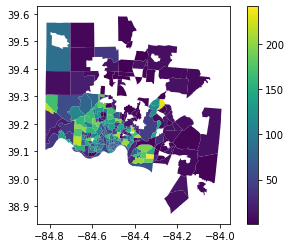

In [22]:
plot_gdf.plot(column='REGISTERED_VOTERS', legend=True)

In [23]:
import bokeh
import json

In [24]:
plot_gdf_no_loc = plot_gdf.drop('LOCATION', axis=1)

In [25]:
plot_json = json.loads(plot_gdf_no_loc.to_json())

json_data = json.dumps(plot_json)

In [26]:
from bokeh.io import output_notebook, show, output_file
from bokeh.plotting import figure, save
from bokeh.models import GeoJSONDataSource, LinearColorMapper, ColorBar, HoverTool
from bokeh.palettes import brewer#Input GeoJSON source that contains features for plotting

In [27]:
json_data = json.dumps(json.loads(plot_gdf_no_loc.to_json()))
geosource = GeoJSONDataSource(geojson = json_data)

palette = brewer['Oranges'][9]
palette = palette[::-1]
vals = plot_gdf_no_loc['REGISTERED_VOTERS']

color_mapper = LinearColorMapper(palette = palette, low = vals.min(), high = vals.max())
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8, width=500, height=20,
                     location=(0,0), orientation='horizontal')

tools = 'wheel_zoom,pan,reset'
p = figure(title = 'Registered Voters', plot_height=800 , plot_width=850, toolbar_location='right', tools=tools)
p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None

p.patches('xs','ys', source=geosource, fill_alpha=1, line_width=0.5, line_color='black',  
              fill_color={'field' :'REGISTERED_VOTERS' , 'transform': color_mapper})
    #Specify figure layout.
p.add_layout(color_bar, 'below')

output_notebook()#Display figure.
show(p)

Loading BokehJS ...

In [28]:
tooltips = [("Tract Name", "@NAMELSAD"),("Voters", "@REGISTERED_VOTERS")]

p.add_tools(HoverTool(tooltips=tooltips))

show(p)

#https://data-dive.com/cologne-bike-rentals-interactive-map-bokeh
#http://dmnfarrell.github.io/bioinformatics/bokeh-maps

In [29]:
outfp = r"C:\Users\kevin\Documents\jupyter notebooks\voter files\Ohio\Hamilton County Maps\census_tracts_registered_voters_25k.html"
output_file("Registered Voters 25k.html")
save(p, outfp)

'C:\\Users\\kevin\\Documents\\jupyter notebooks\\voter files\\Ohio\\Hamilton County Maps\\census_tracts_registered_voters_25k.html'

# Partisanship Score

In [30]:
partisanship_dict = {}
total_voters_dict = {}

for tract in census_tract_clean_gdf['NAMELSAD'].unique():
    mini_gdf = census_tract_clean_gdf[census_tract_clean_gdf['NAMELSAD'] == tract]
    party_count = mini_gdf['PARTY_AFFILIATION'].value_counts()
    if ('R' and 'D') not in party_count.keys():
        tract_score = 0
    elif 'R' not in party_count.keys():
        tract_score = 1.0
    elif 'D' not in party_count.keys():
        tract_score = -1.0
    else:
        tract_score = (party_count['D'] - party_count['R'])/(party_count['D'] + party_count['R'])
    partisanship_dict[tract] = tract_score
    
    total_voters = 0
    if 'R' in party_count.keys():
        total_voters += party_count['R']
        
    if 'D' in party_count.keys():
        total_voters += party_count['D']
        
    total_voters_dict[tract] = total_voters

In [31]:
party_plot_gdf = census_tract_clean_gdf.drop_duplicates(subset="NAMELSAD", keep='first')

In [32]:
for i in party_plot_gdf.index:
    party_plot_gdf.loc[i, "New_Party_Score"] = partisanship_dict[party_plot_gdf.loc[i, 'NAMELSAD']]

C:\Users\kevin\AppData\Local\Programs\Python\Python38\lib\site-packages\geopandas\geodataframe.py:853: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


In [33]:
for i in party_plot_gdf.index:
    party_plot_gdf.loc[i, "TOTAL_VOTERS"] = total_voters_dict[party_plot_gdf.loc[i, 'NAMELSAD']]

In [34]:
party_plot_gdf.head(2)

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry,index_right,SOS_VOTERID,COUNTY_NUMBER,COUNTY_ID,LAST_NAME,FIRST_NAME,MIDDLE_NAME,SUFFIX,DATE_OF_BIRTH,REGISTRATION_DATE,VOTER_STATUS,PARTY_AFFILIATION,RESIDENTIAL_ADDRESS1,RESIDENTIAL_SECONDARY_ADDR,RESIDENTIAL_CITY,RESIDENTIAL_STATE,RESIDENTIAL_ZIP,RESIDENTIAL_ZIP_PLUS4,RESIDENTIAL_COUNTRY,RESIDENTIAL_POSTALCODE,MAILING_ADDRESS1,MAILING_SECONDARY_ADDRESS,MAILING_CITY,MAILING_STATE,MAILING_ZIP,MAILING_ZIP_PLUS4,MAILING_COUNTRY,MAILING_POSTAL_CODE,CAREER_CENTER,CITY,CITY_SCHOOL_DISTRICT,COUNTY_COURT_DISTRICT,CONGRESSIONAL_DISTRICT,COURT_OF_APPEALS,EDU_SERVICE_CENTER_DISTRICT,EXEMPTED_VILL_SCHOOL_DISTRICT,LIBRARY,LOCAL_SCHOOL_DISTRICT,MUNICIPAL_COURT_DISTRICT,PRECINCT_NAME,PRECINCT_CODE,STATE_BOARD_OF_EDUCATION,STATE_REPRESENTATIVE_DISTRICT,STATE_SENATE_DISTRICT,TOWNSHIP,VILLAGE,WARD,PRIMARY-03/07/2000,GENERAL-11/07/2000,SPECIAL-05/08/2001,GENERAL-11/06/2001,PRIMARY-05/07/2002,GENERAL-11/05/2002,SPECIAL-05/06/2003,GENERAL-11/04/2003,PRIMARY-03/02/2004,GENERAL-11/02/2004,SPECIAL-02/08/2005,PRIMARY-05/03/2005,PRIMARY-09/13/2005,GENERAL-11/08/2005,SPECIAL-02/07/2006,PRIMARY-05/02/2006,GENERAL-11/07/2006,PRIMARY-05/08/2007,PRIMARY-09/11/2007,GENERAL-11/06/2007,PRIMARY-11/06/2007,GENERAL-12/11/2007,PRIMARY-03/04/2008,PRIMARY-10/14/2008,GENERAL-11/04/2008,GENERAL-11/18/2008,PRIMARY-05/05/2009,PRIMARY-09/08/2009,PRIMARY-09/15/2009,PRIMARY-09/29/2009,GENERAL-11/03/2009,PRIMARY-05/04/2010,PRIMARY-07/13/2010,PRIMARY-09/07/2010,GENERAL-11/02/2010,PRIMARY-05/03/2011,PRIMARY-09/13/2011,GENERAL-11/08/2011,PRIMARY-03/06/2012,GENERAL-11/06/2012,PRIMARY-05/07/2013,PRIMARY-09/10/2013,PRIMARY-10/01/2013,GENERAL-11/05/2013,PRIMARY-05/06/2014,GENERAL-11/04/2014,PRIMARY-05/05/2015,PRIMARY-09/15/2015,GENERAL-11/03/2015,PRIMARY-03/15/2016,GENERAL-06/07/2016,PRIMARY-09/13/2016,GENERAL-11/08/2016,PRIMARY-05/02/2017,PRIMARY-09/12/2017,GENERAL-11/07/2017,PRIMARY-05/08/2018,GENERAL-08/07/2018,GENERAL-11/06/2018,PRIMARY-05/07/2019,PRIMARY-09/10/2019,GENERAL-11/05/2019,PRIMARY-03/17/2020,FULL_ADDRESS,LOCATION,LAT,LON,New_Party_Score,TOTAL_VOTERS
14,39,061,021602,39061021602,216.02,Census Tract 216.02,G5020,S,3135838,0,+39.2433339,-084.5357212,"POLYGON ((-84.54756 39.25005, -84.54697 39.250...",153067,OH0014010488,31,880118,HAMILTON,DON,R,NaN,1938-05-26,1989-07-17,ACTIVE,D,1250 MEREDITH DR,NaN,CINCINNATI,OH,45231,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GREAT OAKS CAREER CAMPUSES,NaN,MT HEALTHY CITY SD,NaN,2,1,NaN,NaN,NaN,NaN,HAMILTON-CO,SPRINGFIELD P,31-BLQ,4,33,9,SPRINGFIELD TWP.,NaN,NaN,NaN,X,NaN,NaN,NaN,X,NaN,X,NaN,X,NaN,NaN,NaN,NaN,NaN,NaN,X,NaN,NaN,X,NaN,NaN,D,NaN,X,NaN,NaN,NaN,NaN,NaN,X,NaN,NaN,NaN,X,NaN,NaN,X,D,X,NaN,NaN,NaN,X,D,X,NaN,NaN,X,D,NaN,NaN,X,NaN,NaN,X,D,NaN,X,NaN,NaN,X,D,"1250 MEREDITH DR. CINCINNATI, OH 45231 USA","(1250, Meredith Drive, Pleasant Hills, Springf...",39.237752,-84.531462,0.555556,36.0
15,39,061,021603,39061021603,216.03,Census Tract 216.03,G5020,S,4163900,0,+39.2512321,-084.5598290,"POLYGON ((-84.57484 39.24431, -84.57477 39.245...",398755,OH0025056749,31,2006173,WERTS,GLORIA,DIANN,NaN,1944-04-25,2019-04-02,ACTIVE,NaN,8097 HAMILTON AVE,APT 207N,CINCINNATI,OH,45231,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GREAT OAKS CAREER CAMPUSES,NaN,MT HEALTHY CITY SD,NaN,2,1,NaN,NaN,NaN,NaN,HAMILTON-CO,SPRINGFIELD O,31-BLO,4,33,9,SPRINGFIELD TWP.,NaN,NaN,X,X,NaN,NaN,NaN,NaN,NaN,NaN,X,X,X,NaN,NaN,X,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,X,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"8097 HAMILTON AVE. CINCINNATI, OH 45231 USA","(Hamilton Avenue, New Burlington, Springfield ...",39.248277,-84.546844,0.222222,54.0


In [35]:
party_plot_gdf_no_loc = party_plot_gdf.drop("LOCATION", axis=1)

In [37]:
json_data = json.dumps(json.loads(party_plot_gdf_no_loc.to_json()))
geosource = GeoJSONDataSource(geojson = json_data)

palette = brewer['RdBu'][11]
palette = palette[::-1]
vals = party_plot_gdf_no_loc['New_Party_Score']

color_mapper = LinearColorMapper(palette = palette, low = vals.min(), high = vals.max())
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8, width=500, height=20,
                     location=(0,0), orientation='horizontal')

tools = 'wheel_zoom,pan,reset'
s = figure(title = 'Party Score 25k Registered Voters', plot_height=800 , plot_width=850, toolbar_location='right', tools=tools)
s.xgrid.grid_line_color = None
s.ygrid.grid_line_color = None

s.patches('xs','ys', source=geosource, fill_alpha=1, line_width=0.5, line_color='black',  
              fill_color={'field' :'New_Party_Score' , 'transform': color_mapper})
    #Specify figure layout.
s.add_layout(color_bar, 'below')

output_notebook()#Display figure.
show(s)

Loading BokehJS ...

In [38]:
tooltips = [("Tract Name", "@NAMELSAD"),("Partisanship", "@New_Party_Score"),("Total Voters", "@TOTAL_VOTERS")]

s.add_tools(HoverTool(tooltips=tooltips))

show(s)

In [39]:
outfp = r"C:\Users\kevin\Documents\jupyter notebooks\voter files\Ohio\Hamilton County Maps\Party Score 25k voters.html"
output_file("Party Score 25k voters.html")
save(s, outfp)

'C:\\Users\\kevin\\Documents\\jupyter notebooks\\voter files\\Ohio\\Hamilton County Maps\\Party Score 25k voters.html'